In [1]:
import matplotlib.pyplot as plt
import torch 
import torchvision
import torch.nn as nn 
import torch.optim as optim 
import torchvision.models as models
from PIL import Image
from torchvision import transforms, datasets 
from torch.utils.data import Dataset, DataLoader

In [2]:
epochs = 10 
batch_size = 512 

device = ("cuda" if torch.cuda.is_available() else "cpu") 
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck'] 

print(torch.__version__)
print(device)

1.12.1
cuda


In [3]:
transform = transforms.Compose([
    transforms.Resize((224,224)), 
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))]) 

training_data = datasets.CIFAR10(
    root="data", 
    train=True, 
    download=True, 
    transform=transform 
)

validation_data = datasets.CIFAR10(
    root="data",
    train=False, 
    download=True,
    transform=transform
)


Files already downloaded and verified
Files already downloaded and verified


In [20]:
# (class) DataLoader(dataset, batch_size, shuffle, ...)
training_loader = DataLoader(training_data, batch_size=64, shuffle=True)
validation_loader = DataLoader(validation_data, batch_size=64, shuffle=True)

automobile


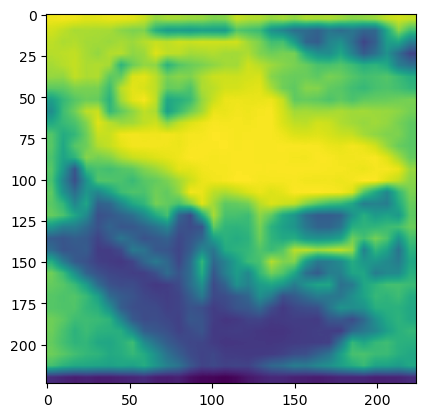

In [43]:
# helper function to show an image
def matplotlib_imshow(img):
    img = img.mean(dim=0)
    img = img / 2 + 0.5
    npimg = img.numpy()
    plt.imshow(npimg)
    
# get some random training images
dataiter = iter(training_loader) 
images, labels = dataiter.next() 

# create grid of images
img_grid = torchvision.utils.make_grid(images[0])

# show images & labels
matplotlib_imshow(img_grid)
print(class_names[labels[0]])

# CNN-based Model for image classification

In [5]:
alexnet = models.alexnet(pretrained=True)
alexnet.classifier[6] = nn.Linear(4096, 10)
vgg = models.vgg16(pretrained=True)
vgg.classifier[6] = nn.Linear(4096,10)
resnet = models.resnet18(pretrained=True)
resnet.fc = nn.Linear(512,10)

# alexnet
criterion1 = nn.CrossEntropyLoss()
optimizer1 = optim.SGD(alexnet.parameters(), lr=0.001, momentum=0.9) 
# vgg
criterion2 = nn.CrossEntropyLoss()
optimizer2 = optim.SGD(vgg.parameters(), lr=0.001, momentum=0.9) 
# resnet
criterion3 = nn.CrossEntropyLoss()
optimizer3 = optim.SGD(resnet.parameters(), lr=0.001, momentum=0.9) 

/home/iknow/anaconda3/envs/ma/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/home/iknow/anaconda3/envs/ma/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/iknow/anaconda3/envs/ma/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` 

In [29]:
from torchsummary import summary as summary_

summary_(alexnet.to(device), (3,224,224), batch_size)
summary_(vgg.to(device), (3,224,224), batch_size)
summary_(resnet.to(device), (3,224,224), batch_size)
# summary_: (model, input_size, batch_size)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [512, 64, 55, 55]          23,296
              ReLU-2          [512, 64, 55, 55]               0
         MaxPool2d-3          [512, 64, 27, 27]               0
            Conv2d-4         [512, 192, 27, 27]         307,392
              ReLU-5         [512, 192, 27, 27]               0
         MaxPool2d-6         [512, 192, 13, 13]               0
            Conv2d-7         [512, 384, 13, 13]         663,936
              ReLU-8         [512, 384, 13, 13]               0
            Conv2d-9         [512, 256, 13, 13]         884,992
             ReLU-10         [512, 256, 13, 13]               0
           Conv2d-11         [512, 256, 13, 13]         590,080
             ReLU-12         [512, 256, 13, 13]               0
        MaxPool2d-13           [512, 256, 6, 6]               0
AdaptiveAvgPool2d-14           [512, 25

In [30]:
def train(model, device, train_loader, optimizer, criterion, epoch):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad() 
        output = model(data)
        loss = criterion(output, target) 
        loss.backward() 
        optimizer.step()
        if (batch_idx + 1) % 30 == 0:
            print("Train Epoch:{} [{}/{} ({:.0f}%)]\tLoss: {:.6f}".format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))

In [33]:
def test(model, device, test_loader, criterion):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += criterion(output, target).item()
            pred = output.max(1, keepdim=True)[1]
            correct += pred.eq(target.view_as(pred)).sum().item()

        test_loss /= len(test_loader.dataset)  # -> mean
        print("\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n".format(
            test_loss, correct, len(test_loader.dataset), 100. * correct / len(test_loader.dataset)))
        print('='*50)

In [34]:
# alexnet
for epoch in range(1, epochs+1):
    train(alexnet, device, training_loader, optimizer1, criterion1, epoch)
    test(alexnet, device, validation_loader, criterion1)

Train Epoch:1 [1856/50000 (4%)]	Loss: 0.309519
Train Epoch:1 [3776/50000 (8%)]	Loss: 0.324207
Train Epoch:1 [5696/50000 (11%)]	Loss: 0.303039
Train Epoch:1 [7616/50000 (15%)]	Loss: 0.310214
Train Epoch:1 [9536/50000 (19%)]	Loss: 0.401662
Train Epoch:1 [11456/50000 (23%)]	Loss: 0.598308
Train Epoch:1 [13376/50000 (27%)]	Loss: 0.550800
Train Epoch:1 [15296/50000 (31%)]	Loss: 0.343404
Train Epoch:1 [17216/50000 (34%)]	Loss: 0.390620
Train Epoch:1 [19136/50000 (38%)]	Loss: 0.433497
Train Epoch:1 [21056/50000 (42%)]	Loss: 0.457832
Train Epoch:1 [22976/50000 (46%)]	Loss: 0.336150
Train Epoch:1 [24896/50000 (50%)]	Loss: 0.380761
Train Epoch:1 [26816/50000 (54%)]	Loss: 0.472800
Train Epoch:1 [28736/50000 (57%)]	Loss: 0.309533
Train Epoch:1 [30656/50000 (61%)]	Loss: 0.622690
Train Epoch:1 [32576/50000 (65%)]	Loss: 0.181059
Train Epoch:1 [34496/50000 (69%)]	Loss: 0.418065
Train Epoch:1 [36416/50000 (73%)]	Loss: 0.431180
Train Epoch:1 [38336/50000 (77%)]	Loss: 0.369299
Train Epoch:1 [40256/50000 

In [35]:
# vgg
for epoch in range(1, epochs+1):
    train(vgg, device, training_loader, optimizer2, criterion2, epoch)
    test(vgg, device, validation_loader, criterion2)

Train Epoch:1 [1856/50000 (4%)]	Loss: 1.317432
Train Epoch:1 [3776/50000 (8%)]	Loss: 0.848220
Train Epoch:1 [5696/50000 (11%)]	Loss: 0.614950
Train Epoch:1 [7616/50000 (15%)]	Loss: 0.652091
Train Epoch:1 [9536/50000 (19%)]	Loss: 0.501620
Train Epoch:1 [11456/50000 (23%)]	Loss: 0.505990
Train Epoch:1 [13376/50000 (27%)]	Loss: 0.647209
Train Epoch:1 [15296/50000 (31%)]	Loss: 0.411368
Train Epoch:1 [17216/50000 (34%)]	Loss: 0.654823
Train Epoch:1 [19136/50000 (38%)]	Loss: 0.586869
Train Epoch:1 [21056/50000 (42%)]	Loss: 0.511463
Train Epoch:1 [22976/50000 (46%)]	Loss: 0.379295
Train Epoch:1 [24896/50000 (50%)]	Loss: 0.450084
Train Epoch:1 [26816/50000 (54%)]	Loss: 0.593270
Train Epoch:1 [28736/50000 (57%)]	Loss: 0.209204
Train Epoch:1 [30656/50000 (61%)]	Loss: 0.268220
Train Epoch:1 [32576/50000 (65%)]	Loss: 0.303973
Train Epoch:1 [34496/50000 (69%)]	Loss: 0.436918
Train Epoch:1 [36416/50000 (73%)]	Loss: 0.417167
Train Epoch:1 [38336/50000 (77%)]	Loss: 0.470175
Train Epoch:1 [40256/50000 

In [36]:
# resnet
for epoch in range(1, epochs+1):
    train(resnet, device, training_loader, optimizer3, criterion3, epoch)
    test(resnet, device, validation_loader, criterion3)

Train Epoch:1 [1856/50000 (4%)]	Loss: 1.660214
Train Epoch:1 [3776/50000 (8%)]	Loss: 1.323828
Train Epoch:1 [5696/50000 (11%)]	Loss: 0.821040
Train Epoch:1 [7616/50000 (15%)]	Loss: 0.551847
Train Epoch:1 [9536/50000 (19%)]	Loss: 0.646594
Train Epoch:1 [11456/50000 (23%)]	Loss: 0.537425
Train Epoch:1 [13376/50000 (27%)]	Loss: 0.403268
Train Epoch:1 [15296/50000 (31%)]	Loss: 0.607040
Train Epoch:1 [17216/50000 (34%)]	Loss: 0.449962
Train Epoch:1 [19136/50000 (38%)]	Loss: 0.544890
Train Epoch:1 [21056/50000 (42%)]	Loss: 0.597377
Train Epoch:1 [22976/50000 (46%)]	Loss: 0.278136
Train Epoch:1 [24896/50000 (50%)]	Loss: 0.285449
Train Epoch:1 [26816/50000 (54%)]	Loss: 0.358253
Train Epoch:1 [28736/50000 (57%)]	Loss: 0.400472
Train Epoch:1 [30656/50000 (61%)]	Loss: 0.217402
Train Epoch:1 [32576/50000 (65%)]	Loss: 0.304627
Train Epoch:1 [34496/50000 (69%)]	Loss: 0.269840
Train Epoch:1 [36416/50000 (73%)]	Loss: 0.329119
Train Epoch:1 [38336/50000 (77%)]	Loss: 0.208764
Train Epoch:1 [40256/50000 

# LIME on CIFAR10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5863
deer


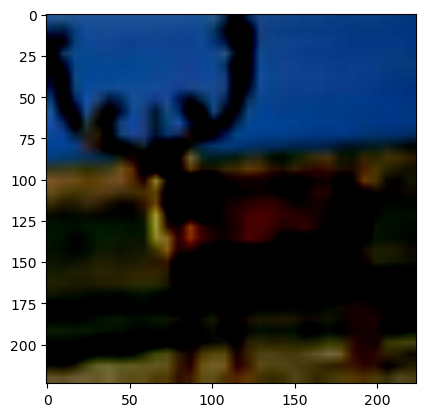

In [6]:
import random
import numpy as np

#! Change the MODEL NAME
model = resnet
# idx = random.randint(0, len(validation_data)-1)
idx=5863
print(idx)

img, label = validation_data[idx]

img = np.transpose(img, (1, 2, 0))
plt.imshow(img)
print(class_names[label])

In [386]:
from torchvision.transforms import ToPILImage

img = np.transpose(img, (2, 0, 1))
# 이미지를 PIL 이미지로 변환
to_pil = ToPILImage()
img = to_pil(img)

In [387]:
def get_input_transform():   
    transf = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
    ])    

    return transf

def get_input_tensors(img):
    transf = get_input_transform()
    # unsqeeze converts single image to batch of 1
    return transf(img).unsqueeze(0)


In [388]:
img_t = get_input_tensors(img)
model.eval()
logits = model(img_t.to(device))

In [389]:
import torch.nn.functional as F

probs = F.softmax(logits, dim=1)
probs5 = probs.topk(5)
tuple((p,c, class_names[c]) for p, c in zip(probs5[0][0].cpu().detach().numpy(), probs5[1][0].cpu().detach().numpy()))


((0.592682, 4, 'deer'),
 (0.26965746, 3, 'cat'),
 (0.122108735, 5, 'dog'),
 (0.011654395, 0, 'airplane'),
 (0.0014857575, 1, 'automobile'))

In [390]:
def get_pil_transform(): 
    transf = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.CenterCrop(224)
    ])    

    return transf

def get_preprocess_transform():
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])     
    transf = transforms.Compose([
        transforms.ToTensor(),
        normalize
    ])    

    return transf    

pill_transf = get_pil_transform()
preprocess_transform = get_preprocess_transform()

In [391]:
def batch_predict(images):
    model.eval()
    batch = torch.stack(tuple(preprocess_transform(i) for i in images), dim=0)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    batch = batch.to(device)
    
    logits = model(batch)
    probs = F.softmax(logits, dim=1)
    return probs.detach().cpu().numpy()

In [392]:
test_pred = batch_predict([pill_transf(img)])
test_pred.squeeze().argmax()

5

In [393]:
from lime import lime_image

explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)), 
                                         batch_predict, # classification function
                                         top_labels=5, 
                                         hide_color=0, 
                                         num_samples=1000) # number of images that will be sent to classification function

  0%|          | 0/1000 [00:00<?, ?it/s]

In [394]:
from skimage.segmentation import mark_boundaries

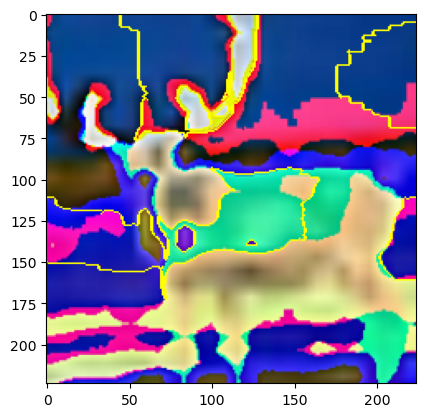

In [395]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)
img_boundry1 = mark_boundaries(temp/255.0, mask)
plt.imshow(img_boundry1)

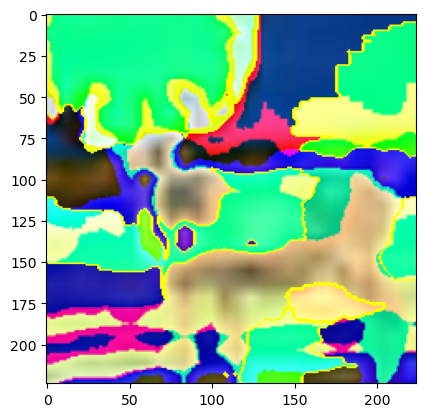

In [396]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
img_boundry2 = mark_boundaries(temp/255.0, mask)
plt.imshow(img_boundry2)

# LIME on breast cancer(뇌졸중) data

In [7]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

In [9]:
cancer = load_breast_cancer()
X_train,X_test,y_train,y_test = train_test_split(cancer.data,cancer.target)

model = RandomForestClassifier()
model.fit(X_train,y_train)

score = model.score(X_test,y_test)
print(score)

0.9370629370629371


In [14]:
# LIME
from lime import lime_tabular
import random

explainer = lime_tabular.LimeTabularExplainer(X_train, mode="classification", feature_names= cancer.feature_names)

idx = random.randint(1, len(X_test))

print("Prediction : ", model.predict(X_test[idx].reshape(1,-1)))
print("Actual :     ", y_test[idx])

Prediction :  [1]
Actual :      1


In [17]:
explanation = explainer.explain_instance(X_test[idx], model.predict_proba, num_features=len(cancer.feature_names), labels=(0,) ,num_samples=5000)
explanation.show_in_notebook()

# LIME on Air Pollution data

In [20]:
import pandas as pd

csv_path = "./data/escape.csv"
df = pd.read_csv(csv_path)

# df = df.drop(['Object_ID', 'X_COORD', 'Y_COORD'], axis=1)
df = df.drop(['Object_ID'], axis=1)

print(len(df.columns))


df.head()

103


,X_COORD,Y_COORD,NO2conc,HDRES_1000,HDRES_500,HDRES_300,HDRES_200,HDRES_100,LDRES_1000,LDRES_500,...,ROADLENGTH_25,ROADLENGTH_10,TRAFLOAD_1000,TRAFLOAD_500,TRAFLOAD_300,TRAFLOAD_200,TRAFLOAD_100,TRAFLOAD_50,TRAFLOAD_25,TRAFLOAD_10
0,415833,431368,52.95,0.000,0.00000,0.0,0.0,0.0,2971206.545,785039.3436,...,129.025409,12.823533,198120834.2,61750712.99,3.098135e+07,1.984760e+07,9.579769e+06,4.674530e+06,1.112275e+06,26452.35633
1,415319,432278,37.93,0.000,0.00000,0.0,0.0,0.0,2849471.773,715031.4112,...,48.024560,14.397661,156517623.7,30443270.27,1.180329e+07,4.620653e+06,1.780275e+06,7.824133e+05,3.739673e+05,112114.58930
2,415268,432962,37.78,217261.649,2329.86608,0.0,0.0,0.0,2606885.575,698743.4372,...,74.777136,11.496267,175908527.6,29741454.35,1.298416e+07,6.856058e+06,1.552641e+06,2.883515e+05,1.177241e+05,20529.95228
3,414278,432387,36.28,0.000,0.00000,0.0,0.0,0.0,2678968.710,785039.3436,...,59.429558,16.356957,120544278.0,33736018.78,9.382543e+06,2.641648e+06,8.681004e+05,2.985128e+05,6.053453e+04,18389.64784
4,414713,434100,52.73,0.000,0.00000,0.0,0.0,0.0,2591527.723,785033.1622,...,78.543927,12.016461,157599564.4,48178434.16,2.342485e+07,1.374394e+07,3.912683e+06,1.773984e+06,8.075084e+05,192071.11110


In [21]:
from sklearn.model_selection import train_test_split

# X, Y = df.data, df.target
X = df.drop('NO2conc', axis=1)
Y = df['NO2conc']

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, train_size=0.90, test_size=0.1, random_state=123, shuffle=True)
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((43, 102), (5, 102), (43,), (5,))

In [22]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb

# Linear Regression model
SimpleRegression = LinearRegression()
LassoRegression = Lasso()
RidgeRegression = Ridge()
ElasticRegression = ElasticNet()

# Nonlinear ML model
RFmodel = RandomForestRegressor()
XGBOOSTmodel = xgb.XGBRegressor()

# fit
SimpleRegression.fit(X_train, Y_train)
LassoRegression.fit(X_train, Y_train)
RidgeRegression.fit(X_train, Y_train)
ElasticRegression.fit(X_train, Y_train)
RFmodel.fit(X_train, Y_train)
XGBOOSTmodel.fit(X_train, Y_train)

# Print Score
print("< Simple Regression >")
print("Test R^2 Score  : ", SimpleRegression.score(X_test, Y_test))
print("Train R^2 Score : ", SimpleRegression.score(X_train, Y_train))
print("< LASSO Regression >")
print("Test R^2 Score  : ", LassoRegression.score(X_test, Y_test))
print("Train R^2 Score : ", LassoRegression.score(X_train, Y_train))
print("< Ridge Regression >")
print("Test R^2 Score  : ", RidgeRegression.score(X_test, Y_test))
print("Train R^2 Score : ", RidgeRegression.score(X_train, Y_train))
print("< Elastic Regression >")
print("Test R^2 Score  : ", ElasticRegression.score(X_test, Y_test))
print("Train R^2 Score : ", ElasticRegression.score(X_train, Y_train))
print("< Random Forest >")
print("Test R^2 Score  : ", RFmodel.score(X_test, Y_test))
print("Train R^2 Score : ", RFmodel.score(X_train, Y_train))
print("< XGBOOST >")
print("Test R^2 Score  : ", XGBOOSTmodel.score(X_test, Y_test))
print("Train R^2 Score : ", XGBOOSTmodel.score(X_train, Y_train))

/home/iknow/anaconda3/envs/ma/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.087e+00, tolerance: 4.332e-01
  model = cd_fast.enet_coordinate_descent(
/home/iknow/anaconda3/envs/ma/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:253: LinAlgWarning: Ill-conditioned matrix (rcond=2.70637e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
/home/iknow/anaconda3/envs/ma/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.483e+00, tolerance: 4.332e-01
  model = cd_fast.enet_coordinate_descent(


< Simple Regression >
Test R^2 Score  :  -0.10176115519579088
Train R^2 Score :  1.0
< LASSO Regression >
Test R^2 Score  :  0.7516082096166998
Train R^2 Score :  0.9998720596179572
< Ridge Regression >
Test R^2 Score  :  -0.10176101054602671
Train R^2 Score :  0.9999999999999973
< Elastic Regression >
Test R^2 Score  :  0.711759072805813
Train R^2 Score :  0.9998088054031664
< Random Forest >
Test R^2 Score  :  0.7111318822957831
Train R^2 Score :  0.9397790629893422
< XGBOOST >
Test R^2 Score  :  0.5943926822581453
Train R^2 Score :  0.9999999982156902


In [23]:
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(X.values, mode="regression", feature_names = X.columns)
explainer

In [24]:
idx = random.randint(0, len(X_test)-1)
print(idx)

# Simple
print("Simple Prediction : ", SimpleRegression.predict(X_test)[idx])
# LASSO
print("LASSO Prediction : ", LassoRegression.predict(X_test)[idx])
# Ridge
print("Ridge Prediction : ", RidgeRegression.predict(X_test)[idx])
# Elastic
print("Elastic Prediction : ", ElasticRegression.predict(X_test)[idx])
# RF
print("Random Forest Prediction : ", RFmodel.predict(X_test)[idx])
# XGBOOST
print("XGBOOST Prediction : ", XGBOOSTmodel.predict(X_test)[idx])
# Gold
print("Actual :     ", Y_test.values[idx])


# Explanation
SimpleExplanation = explainer.explain_instance(X_test.values[idx], SimpleRegression.predict, num_features=len(X.columns))
LASSOExplanation = explainer.explain_instance(X_test.values[idx], LassoRegression.predict, num_features=len(X.columns))
RidgeExplanation = explainer.explain_instance(X_test.values[idx], RidgeRegression.predict, num_features=len(X.columns))
ElasticExplanation = explainer.explain_instance(X_test.values[idx], ElasticRegression.predict, num_features=len(X.columns))
RFExplanation = explainer.explain_instance(X_test.values[idx], RFmodel.predict, num_features=len(X.columns))
XGBOOSTExplanation = explainer.explain_instance(X_test.values[idx], XGBOOSTmodel.predict, num_features=len(X.columns))


3
Simple Prediction :  26.013448747280037
LASSO Prediction :  15.78845175754017
Ridge Prediction :  26.013448473059526
Elastic Prediction :  15.192030191183788
Random Forest Prediction :  26.352199999999996
XGBOOST Prediction :  30.477789
Actual :      22.6


/home/iknow/anaconda3/envs/ma/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/home/iknow/anaconda3/envs/ma/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but Lasso was fitted with feature names
  warnings.warn(
/home/iknow/anaconda3/envs/ma/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but Ridge was fitted with feature names
  warnings.warn(
/home/iknow/anaconda3/envs/ma/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but ElasticNet was fitted with feature names
  warnings.warn(
/home/iknow/anaconda3/envs/ma/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [27]:
# Simple
SimpleExplanation.show_in_notebook()

In [28]:
# LASSO
LASSOExplanation.show_in_notebook()

In [29]:
# Ridge
RidgeExplanation.show_in_notebook()

In [30]:
# Elastic
ElasticExplanation.show_in_notebook()

In [31]:
# RF
RFExplanation.show_in_notebook()

In [32]:
# XGBOOST
XGBOOSTExplanation.show_in_notebook()

# Interpretability in Linear Regression(via coef. of model)

In [33]:
print(len(SimpleRegression.coef_))
print(len(LassoRegression.coef_))
print(len(RidgeRegression.coef_))
print(len(ElasticRegression.coef_))

102
102
102
102


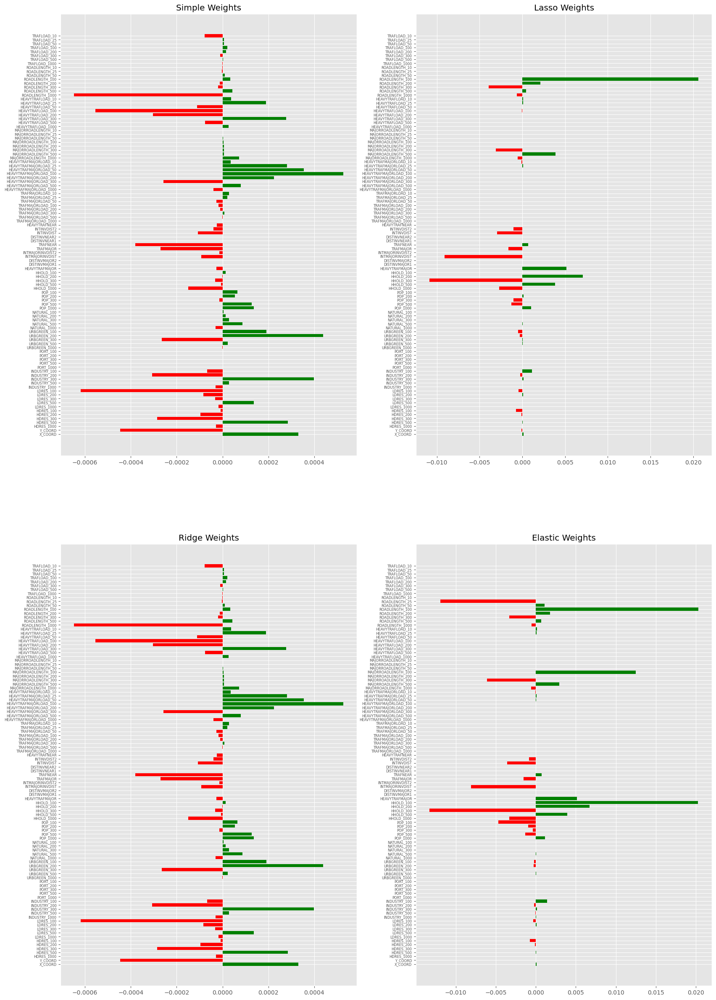

In [34]:
with plt.style.context("ggplot"):
    fig, axes = plt.subplots(2,2, figsize=(20,30))

    axes[0][0].barh(range(len(SimpleRegression.coef_)), SimpleRegression.coef_, color=["red" if coef<0 else "green" for coef in SimpleRegression.coef_])
    axes[0][0].set_yticks(range(len(SimpleRegression.coef_)))
    axes[0][0].set_yticklabels(X.columns, fontsize=6)
    axes[0][0].set_title("Simple Weights")
    
    axes[0][1].barh(range(len(LassoRegression.coef_)), LassoRegression.coef_, color=["red" if coef<0 else "green" for coef in LassoRegression.coef_])
    axes[0][1].set_yticks(range(len(LassoRegression.coef_)))
    axes[0][1].set_yticklabels(X.columns, fontsize=6)
    axes[0][1].set_title("Lasso Weights")
    
    axes[1][0].barh(range(len(RidgeRegression.coef_)), RidgeRegression.coef_, color=["red" if coef<0 else "green" for coef in RidgeRegression.coef_])
    axes[1][0].set_yticks(range(len(RidgeRegression.coef_)))
    axes[1][0].set_yticklabels(X.columns, fontsize=6)
    axes[1][0].set_title("Ridge Weights")
    
    axes[1][1].barh(range(len(ElasticRegression.coef_)), ElasticRegression.coef_, color=["red" if coef<0 else "green" for coef in ElasticRegression.coef_])
    axes[1][1].set_yticks(range(len(ElasticRegression.coef_)))
    axes[1][1].set_yticklabels(X.columns, fontsize=6)
    axes[1][1].set_title("Elastic Weights")

In [35]:
SimpleExplanation.as_list()
LASSOExplanation.as_list()
RidgeExplanation.as_list()
ElasticExplanation.as_list()

[('LDRES_1000 <= 2087117.74', -20.97967204431662),
 ('NATURAL_500 > 0.00', 17.65738540351566),
 ('ROADLENGTH_1000 <= 34344.95', 13.565688088032218),
 ('POP_1000 <= 8688.25', -11.737037141420544),
 ('TRAFMAJORLOAD_100 <= 0.00', -11.251718441676372),
 ('HHOLD_1000 <= 3243.75', 10.902873156541926),
 ('HDRES_100 <= 0.00', 10.735536372198956),
 ('NATURAL_1000 > 0.00', -9.74978277575777),
 ('ROADLENGTH_300 <= 3148.21', 9.531071180283506),
 ('ROADLENGTH_100 <= 400.79', -8.285467071872205),
 ('TRAFMAJORLOAD_25 <= 0.00', -8.059555023792313),
 ('URBGREEN_500 <= 0.00', -7.15773545691573),
 ('TRAFLOAD_300 <= 6135317.44', -7.096491091013241),
 ('HDRES_500 <= 0.00', -7.081381192128343),
 ('LDRES_200 <= 97609.93', -6.817021084211626),
 ('LDRES_100 <= 29246.39', 6.739451505566814),
 ('HEAVYTRAFMAJORLOAD_300 <= 0.00', 6.707094983749463),
 ('INDUSTRY_1000 <= 0.00', -6.421970981412379),
 ('HHOLD_300 <= 297.25', 6.02814422995148),
 ('TRAFNEAR <= 1205.59', -5.971302015554068),
 ('INDUSTRY_300 <= 0.00', -5.